In [ ]:
# LIBRARIES

In [ ]:
!pip install matplotlib
!pip install seaborn
!pip install plotly
!pip install numpy
!pip install missingno
!pip install scikit-learn
!pip install easygui
!pip install keras
!pip install tensorflow
!pip install opencv-python

In [ ]:
# IMPORTS

In [1]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Preprocessing and Image
from sklearn.model_selection import train_test_split
import cv2
from keras.utils import image_dataset_from_directory
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

import warnings
warnings.filterwarnings("ignore")

In [ ]:
# LOADING DATA

In [3]:
train_dir ="train"
test_dir = "test"
valid_dir = "valid"

In [5]:
train_img = [os.path.join(train_dir, f) for f in os.listdir(train_dir)]
test_img = [os.path.join(test_dir, f) for f in os.listdir(test_dir)]
valid_img = [os.path.join(valid_dir, f) for f in os.listdir(valid_dir)]

In [ ]:
# GENARATION OF THE IMAGE

In [ ]:
#### TRAINING DATA

In [7]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
      rescale=1./255,
      rotation_range=25,
      width_shift_range=0.1,
      height_shift_range=0.1,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

In [9]:
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(224,224),
                                                    batch_size=150,
                                                    subset = 'training',
                                                    class_mode='categorical',
                                                    color_mode='rgb')

Found 3208 images belonging to 20 classes.


In [ ]:
#### TESTING DATA

In [11]:
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

In [13]:
test_generator = test_datagen.flow_from_directory(test_dir,
                                                    target_size=(224,224),
                                                    batch_size=64,
                                                    class_mode='categorical',
                                                    color_mode='rgb')

Found 100 images belonging to 20 classes.


In [15]:
#### VALIDATION DATA

In [17]:
val_datagen=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

In [19]:
val_generator = val_datagen.flow_from_directory(valid_dir,
                                                target_size=(224,224),
                                                batch_size=150,
                                                class_mode='categorical',
                                                color_mode='rgb')

Found 100 images belonging to 20 classes.


In [ ]:
# IMAGE PREPROCESSING

In [21]:
import pandas as pd
import numpy as np
from glob import glob
import cv2
import matplotlib.pyplot as plt

In [23]:
ABBOTTS_BABBLER_files = glob('test/ABBOTTS BABBLER/*.jpg')

In [25]:
img_cv2 = [cv2.imread(ABBOTTS_BABBLER_files[4])]
img_mpl = np.array(img_cv2)
img_mpl.shape, img_cv2[0].shape

((1, 224, 224, 3), (224, 224, 3))

In [27]:
def grayscale(image):
    """Converts a color image to grayscale."""
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [29]:
def flip(image):
  """Horizontally flips an image."""
  return cv2.flip(image, 1)

In [31]:
def crop(image, size):
  """Crops an image to a specific size."""
  height, width = image.shape[:2]
  x = (width - size) // 2
  y = (height - size) // 2
  return image[y:y+size, x:x+size]

In [33]:
def rotate(image, angle):
    """Rotates an image by a specified angle."""
    rows, cols = image.shape[:2]
    M = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1)
    return cv2.warpAffine(image, M, (cols, rows))

In [35]:
# Assuming you have a list of images stored in the variable 'image_files'
images = []
for file in ABBOTTS_BABBLER_files:
    img = cv2.imread(file)
    images.append(img)

In [ ]:
#### DISSPLAYING IMAGES

In [37]:
for i, image in enumerate(images[:5]):
    # Process only the first 5 images
    # Grayscale conversion
    gray_image = grayscale(image)
    # Image flipping
    flipped_image = flip(image)
    # Image rotation
    rotated_image = rotate(image, 45)
    # Image cropping
    cropped_image = crop(image, 24)

In [ ]:
#### VISUALIZE THE RESULTS

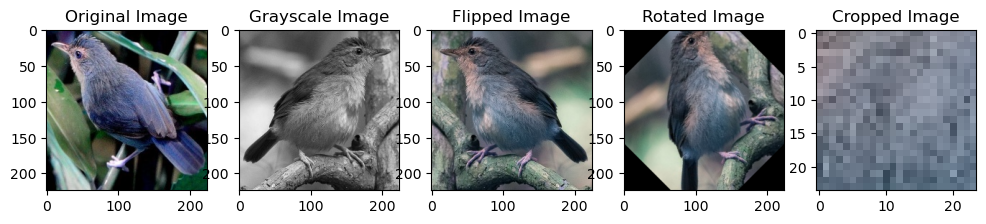

In [39]:

plt.figure(figsize=(12, 6))
plt.subplot(1, 5, 1)
plt.imshow(images[0])
plt.title("Original Image")
plt.subplot(1, 5, 2)
plt.imshow(gray_image, cmap='gray')
plt.title("Grayscale Image")
plt.subplot(1, 5, 3)
plt.imshow(flipped_image)
plt.title("Flipped Image")
plt.subplot(1, 5, 4)
plt.imshow(rotated_image)
plt.title("Rotated Image")
plt.subplot(1, 5, 5)
plt.imshow(cropped_image)
plt.title("Cropped Image")
plt.show()

In [41]:
import pandas as pd
import numpy as np
from glob import glob
import cv2
import matplotlib.pyplot as plt

In [43]:
ABBOTTS_BABBLER_files = glob('test/ABBOTTS BABBLER/*.jpg')
print(ABBOTTS_BABBLER_files)

['test/ABBOTTS BABBLER\\1.jpg', 'test/ABBOTTS BABBLER\\2.jpg', 'test/ABBOTTS BABBLER\\3.jpg', 'test/ABBOTTS BABBLER\\4.jpg', 'test/ABBOTTS BABBLER\\5.jpg']


In [45]:
img_cv2 = [cv2.imread(im) for im in ABBOTTS_BABBLER_files]
print(len(img_cv2))
img_cv2[0].shape

5


(224, 224, 3)

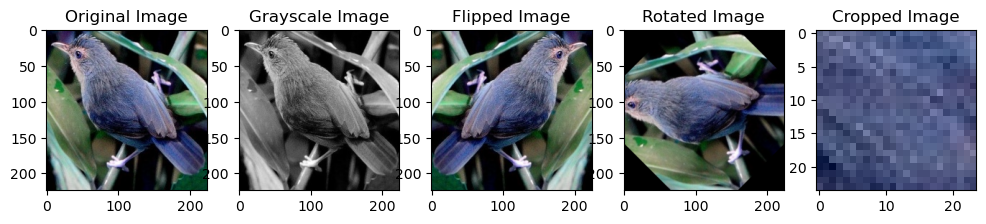

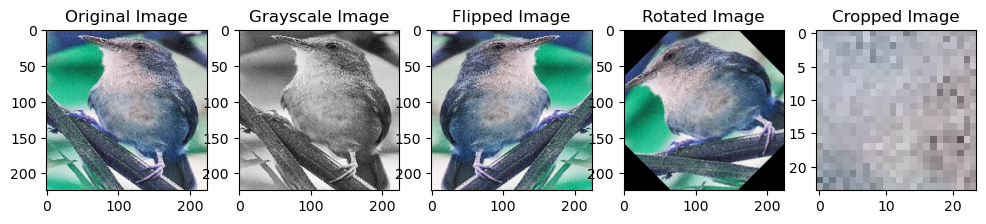

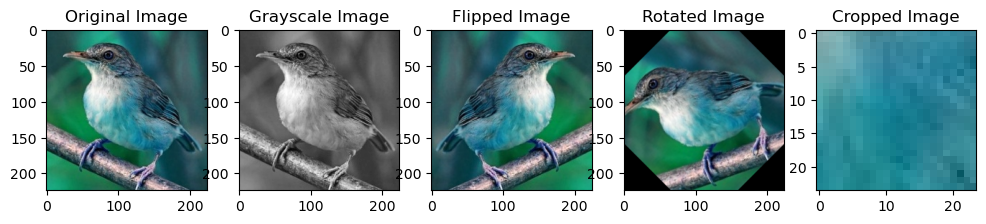

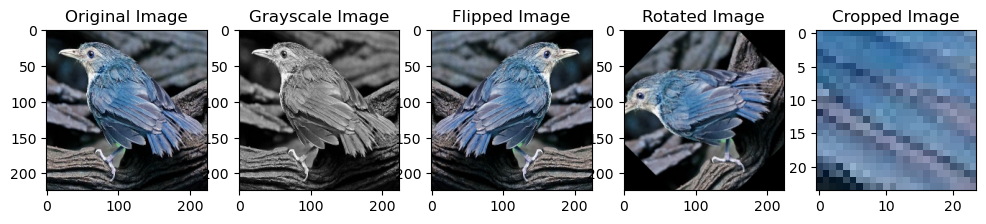

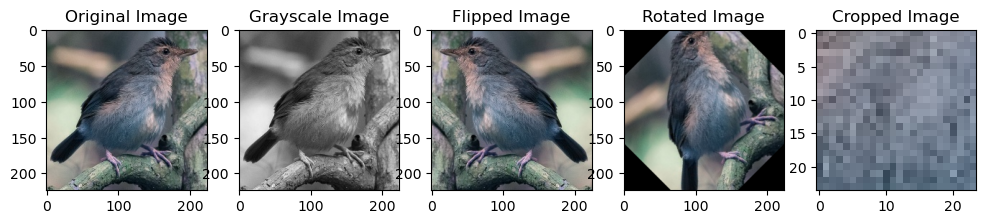

In [47]:
for i, image in enumerate(img_cv2[:5]):  
    # Process only the first 5 images
    # Grayscale conversion
    gray_image = grayscale(image)
    # Image flipping
    flipped_image = flip(image)
    # Image rotation
    rotated_image = rotate(image, 45)
    # Image cropping
    cropped_image = crop(image, 24)
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 5, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.subplot(1, 5, 2)
    plt.imshow(gray_image, cmap='gray')
    plt.title("Grayscale Image")
    plt.subplot(1, 5, 3)
    plt.imshow(flipped_image)
    plt.title("Flipped Image")
    plt.subplot(1, 5, 4)
    plt.imshow(rotated_image)
    plt.title("Rotated Image")
    plt.subplot(1, 5, 5)
    plt.imshow(cropped_image) 
    plt.title("Cropped Image")
    plt.show()


# EXPLORATORY DATA ANALYLIS

## IMPORTING NECESSARY LIBRARIES

In [49]:
import itertools
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from PIL import Image
from sklearn.metrics import classification_report, f1_score , confusion_matrix

# Tensorflow Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, models, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import mixed_precision

mixed_precision.set_global_policy('mixed_float16')

print(tf.__version__)

# Load dataset
dataset = {
             "train_data" : "train",
             "valid_data" : "valid",
             "test_data" : "test"
          }

all_data = []
for path in dataset.values():
    data = {"imgpath": [] , "labels": [] }
    category = os.listdir(path)

    for folder in category:
        folderpath = os.path.join(path , folder)
        filelist = os.listdir(folderpath)
        for file in filelist:
            fpath = os.path.join(folderpath, file)
            data["imgpath"].append(fpath)
            data["labels"].append(folder)
        
    all_data.append(data.copy())
    data.clear()

train_df = pd.DataFrame(all_data[0] , index=range(len(all_data[0]['imgpath'])))
valid_df = pd.DataFrame(all_data[1] , index=range(len(all_data[1]['imgpath'])))
test_df = pd.DataFrame(all_data[2] , index=range(len(all_data[2]['imgpath'])))

# Convert labels to numbers
lb = LabelEncoder()
train_df['encoded_labels'] = lb.fit_transform(train_df['labels'])
valid_df['encoded_labels'] = lb.fit_transform(valid_df['labels'])
test_df['encoded_labels'] = lb.fit_transform(test_df['labels'])

2.17.0


In [51]:
import cv2

## DISPLAYING SAMPLE DATA

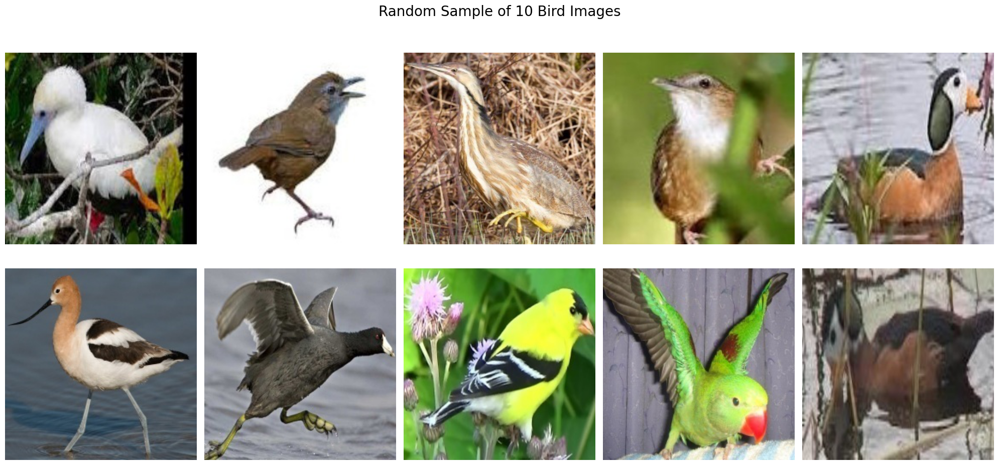

In [53]:
import random
from PIL import Image

# Function to load and preprocess images
def load_image(img_path):
    img = Image.open(img_path)
    img = img.resize((224, 224))  # Resize to 224x224 or any other size
    return img

# Get 10 random image paths from the dataset
random_image_paths = random.sample(train_df['imgpath'].tolist(), 10)

# Create a figure with a 2x5 grid of subplots
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Plot the images
for ax, img_path in zip(axes.flatten(), random_image_paths):
    img = load_image(img_path)
    ax.imshow(img)
    ax.axis('off')  # Remove axis

plt.suptitle('Random Sample of 10 Bird Images', fontsize=20)
plt.tight_layout()
plt.show()


## DISTRIBUTION OF IMAGES PER SPECIES

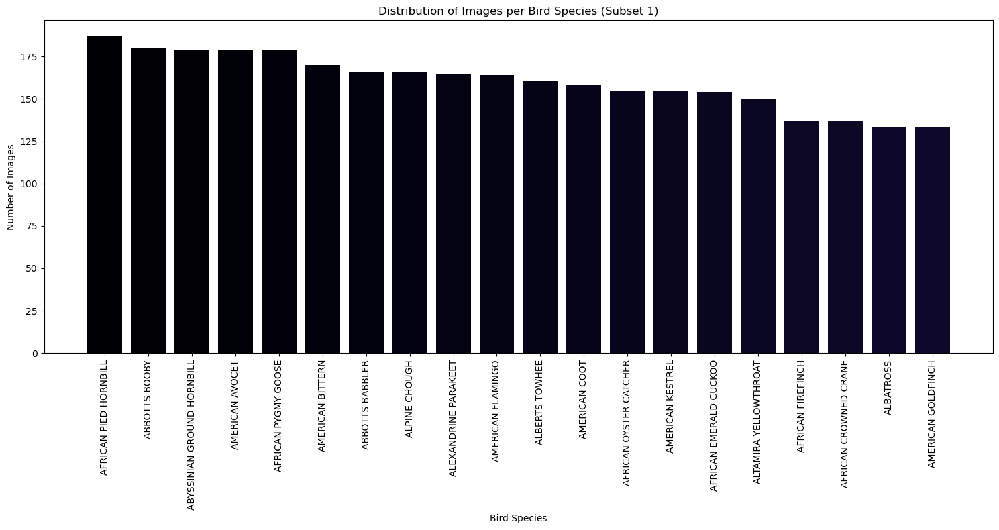

In [54]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Create subplots for the distribution of images per bird species
species_counts = train_df['labels'].value_counts()
num_species = len(species_counts)
species_per_plot = 50
num_plots = (num_species // species_per_plot) + (1 if num_species % species_per_plot != 0 else 0)

fig, axes = plt.subplots(num_plots, 1, figsize=(15, 8 * num_plots))

if num_plots == 1:
    axes = [axes]

for i in range(num_plots):
    start = i * species_per_plot
    end = min(start + species_per_plot, num_species)
    species_subset = species_counts.iloc[start:end]
    
    # Use inferno for odd plots and viridis for even plots
    cmap = cm.inferno if i % 2 == 0 else cm.viridis
    colors = cmap(range(len(species_subset)))
    
    axes[i].bar(species_subset.index, species_subset.values, color=colors)
    axes[i].set_title(f'Distribution of Images per Bird Species (Subset {i + 1})')
    axes[i].set_xlabel('Bird Species')
    axes[i].set_ylabel('Number of Images')
    axes[i].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

## DISTRIBUTION OF IMAGES WIDTH AND HEIGHT

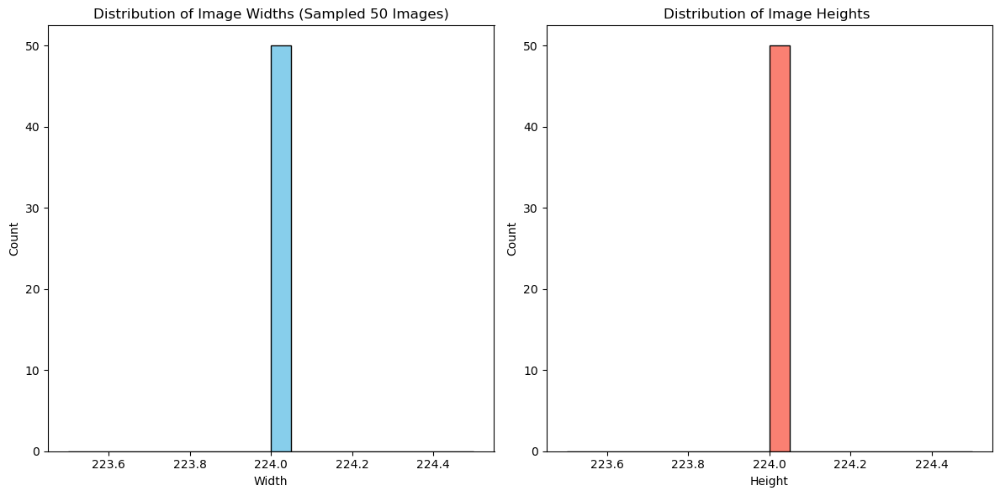

In [57]:
import pandas as pd

# Function to get image sizes
def get_image_sizes(image_paths):
    sizes = []
    for path in image_paths:
        img = Image.open(path)
        sizes.append(img.size)
    return sizes

# Sample 50 random image paths from the training data
random_image_paths = random.sample(train_df['imgpath'].tolist(), 50)

# Get image sizes for the sampled images
sampled_sizes = get_image_sizes(random_image_paths)
sampled_sizes_df = pd.DataFrame(sampled_sizes, columns=['width', 'height'])

# Plot distribution of image sizes
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(sampled_sizes_df['width'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Image Widths (Sampled 50 Images)')
plt.xlabel('Width')
plt.ylabel('Count')

plt.subplot(1, 2, 2)
plt.hist(sampled_sizes_df['height'], bins=20, color='salmon', edgecolor='black')
plt.title('Distribution of Image Heights ')
plt.xlabel('Height')
plt.ylabel('Count')

plt.tight_layout()
plt.show()

## ERROR LEVER ANALYSIS(ELA)
## GRAPH

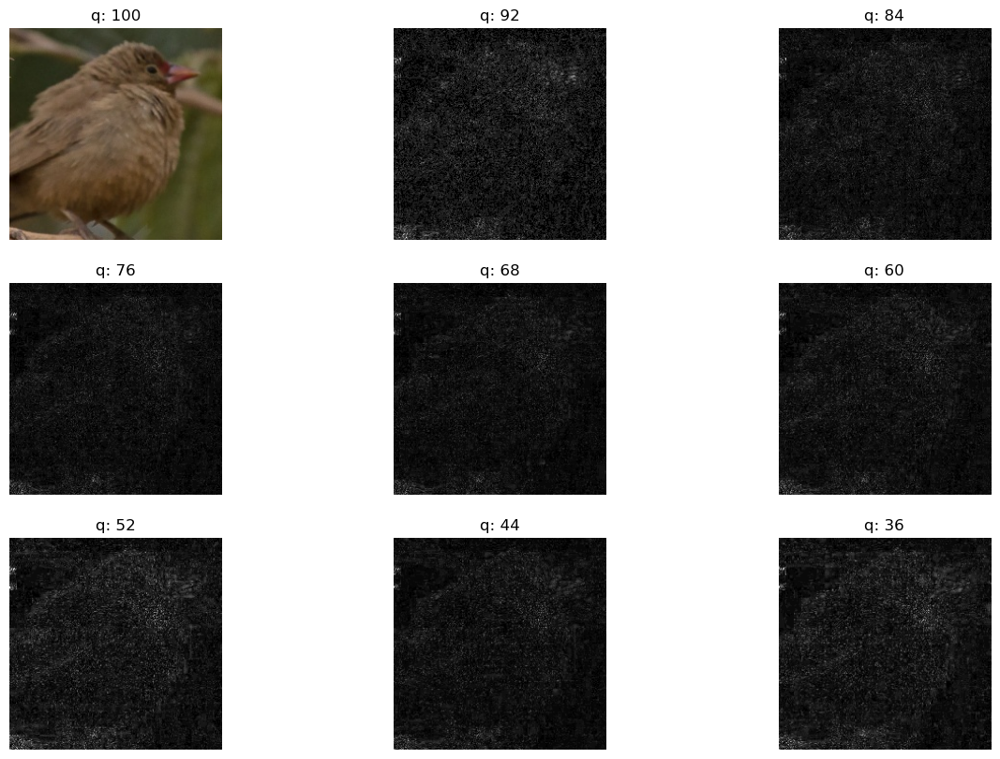

In [61]:
# Function to compute ELA
def compute_ela_cv(path, quality=90):
    temp_filename = 'temp_ela.jpg'
    ela_filename = 'temp_ela_ela.png'
    
    # Save the image with the given quality
    image = cv2.imread(path)
    cv2.imwrite(temp_filename, image, [int(cv2.IMWRITE_JPEG_QUALITY), quality])
    
    # Open the saved image and calculate the difference
    saved_image = cv2.imread(temp_filename)
    ela_image = cv2.absdiff(image, saved_image)
    
    # Scale the difference for better visibility
    ela_image = cv2.cvtColor(ela_image, cv2.COLOR_BGR2GRAY)
    min_val, max_val = ela_image.min(), ela_image.max()
    ela_image = (ela_image - min_val) / (max_val - min_val) * 255
    ela_image = cv2.cvtColor(ela_image.astype('uint8'), cv2.COLOR_GRAY2RGB)
    
    return ela_image / 255.0

# Directory containing images
image_dir = 'train/AFRICAN FIREFINCH'

# Select a random image from the dataset
p = os.path.join(image_dir, random.choice(os.listdir(image_dir)))
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0

init_val = 100
columns = 3
rows = 3

fig = plt.figure(figsize=(15, 10))
for i in range(1, columns * rows + 1):
    quality = init_val - (i - 1) * 8
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
    plt.axis('off')
plt.show()

## DISTRIBUTION OF COLOUR CHANNELS

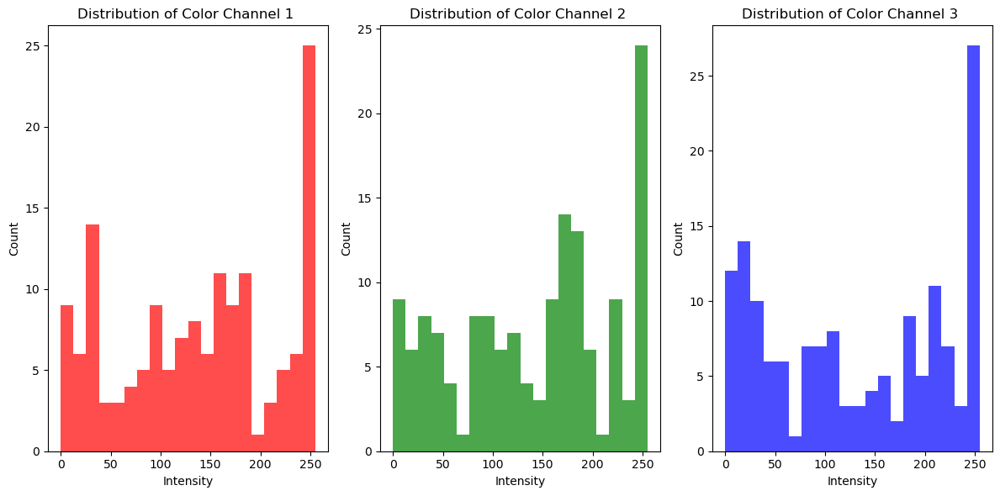

In [63]:
import random

# Function to extract dominant colors from images
def extract_colors(image_paths, num_colors=3):
    colors = []
    for path in image_paths:
        img = Image.open(path)
        img = img.resize((100, 100))  # Resize for faster processing
        dominant_colors = img.convert('RGB').getcolors(1000000)
        dominant_colors.sort(reverse=True, key=lambda x: x[0])
        top_colors = dominant_colors[:num_colors]
        colors.append([color for count, color in top_colors])
    return colors

# Sample 50 random image paths from the training data
random_image_paths = random.sample(train_df['imgpath'].tolist(), 50)

# Extract dominant colors for the sampled images
sampled_colors = extract_colors(random_image_paths)

# Plot color distribution
plt.figure(figsize=(12, 6))
for i in range(3):
    color_channel = [color[i] for colors in sampled_colors for color in colors]
    plt.subplot(1, 3, i+1)
    plt.hist(color_channel, bins=20, color=['red', 'green', 'blue'][i], alpha=0.7)
    plt.title(f'Distribution of Color Channel {i+1} ')
    plt.xlabel('Intensity')
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

## DISTRIBUTION OF PIXEL INTENSITIES

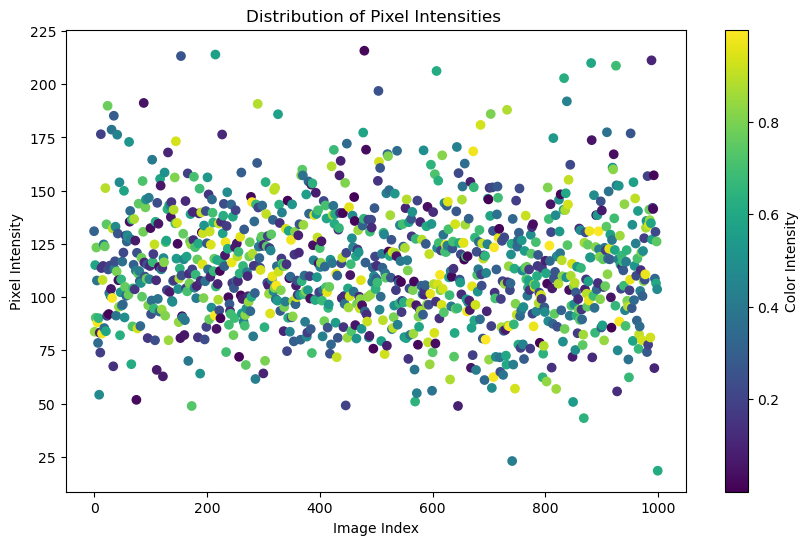

In [67]:
# Function to calculate average pixel intensity
def average_pixel_intensity(img):
    return np.mean(np.array(img))

# Sample 100 random image paths from the training data
random_image_paths = random.sample(train_df['imgpath'].tolist(), 1000)

# Calculate average pixel intensity for each sampled image
pixel_intensities = [average_pixel_intensity(Image.open(path)) for path in random_image_paths]

# Create a scatter plot with multicolored points
plt.figure(figsize=(10, 6))
colors = np.random.rand(len(pixel_intensities))  # Generate random colors for each point

plt.scatter(range(len(pixel_intensities)), pixel_intensities, c=colors, cmap='viridis')
plt.colorbar(label='Color Intensity')
plt.title('Distribution of Pixel Intensities ')
plt.xlabel('Image Index')
plt.ylabel('Pixel Intensity')
plt.show()


## SOME IMAGE SAMPLES ALONG WITH THEIR LABELS

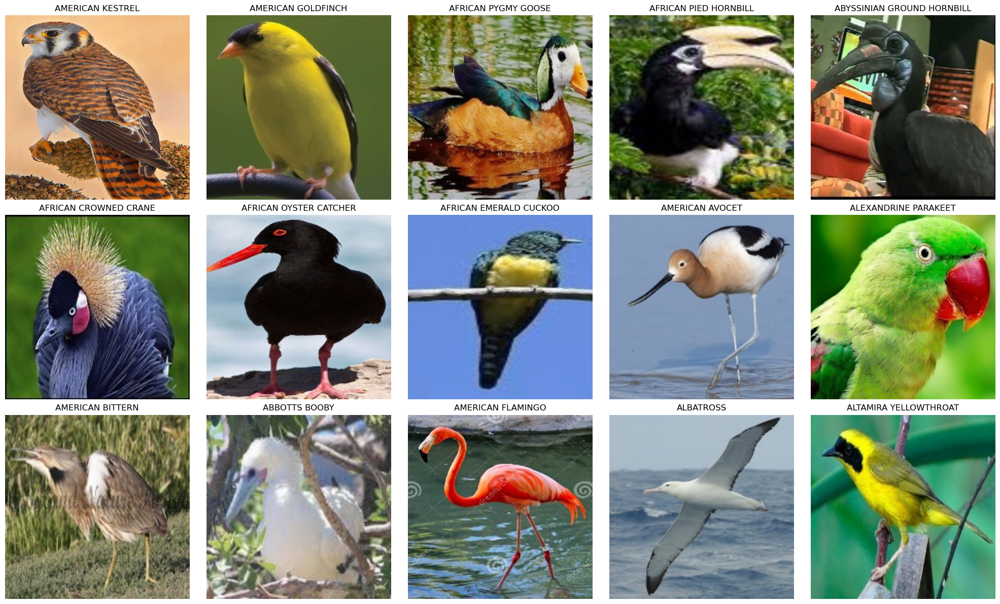

In [69]:
# Sample 15 random classes
random_classes = random.sample(train_df['labels'].unique().tolist(), 15)

# Create a figure to display the images
fig, axes = plt.subplots(3, 5, figsize=(20, 12))

for ax, class_name in zip(axes.flatten(), random_classes):
    # Get a random image path from the selected class
    class_images = train_df[train_df['labels'] == class_name]['imgpath'].tolist()
    random_image_path = random.choice(class_images)
    
    # Open and display the image
    img = Image.open(random_image_path)
    ax.imshow(img)
    ax.set_title(class_name)
    ax.axis('off')  # Hide the axes

plt.tight_layout()
plt.show()

## COLOUR ANALYSIS

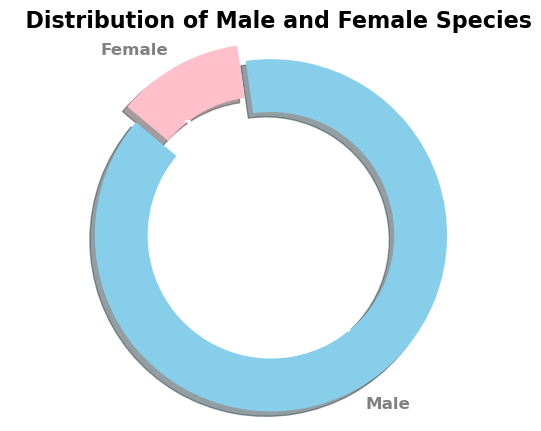

In [71]:
# Example function to extract dominant colors from images (you might need to adjust this based on your specific requirements)
def extract_dominant_colors(img, intensity_threshold=150):
    # Calculate the average intensity of the image
    intensity = np.mean(np.array(img))
    
    # Classify based on intensity threshold
    if intensity > intensity_threshold:
        return 'Female'
    else:
        return 'Male'

# Sample classification function based on color analysis
def classify_species_by_color(img):
    return extract_dominant_colors(img)

# Sample 1000 random image paths from the training data
random_image_paths = random.sample(train_df['imgpath'].tolist(), 1000)

# Classify each species as male or female based on color analysis
gender_classifications = [classify_species_by_color(Image.open(path)) for path in random_image_paths]

# Count the occurrences of male and female species
gender_counts = pd.Series(gender_classifications).value_counts()

labels = gender_counts.index
sizes = gender_counts.values
colors = ['skyblue', 'pink']  # Different shades of blue and pink
explode = (0.1, 0)  # "explode" the 1st slice (i.e., 'Male')

fig, ax = plt.subplots(figsize=(5, 5))
wedges, texts, autotexts = ax.pie(
    sizes,
    explode=explode,
    labels=labels,
    colors=colors,
    autopct='%1.1f%%',
    shadow=True,
    startangle=140,
    wedgeprops=dict(width=0.3)
)

# Improve the look of the text and labels
plt.setp(texts, size=12, weight="bold", color="gray")
plt.setp(autotexts, size=12, weight="bold", color="white")

# Add a title
ax.set_title("  Distribution of Male and Female Species", size=16, weight="bold")

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

## GRABCUT ALGORITHM IN IMAGES(SEGMENTATION)

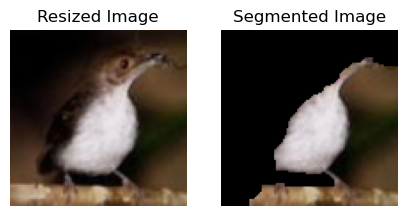

In [73]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Directory containing images
data_dir = "train"

# Select a random image from the dataset
random_class = np.random.choice(os.listdir(data_dir))
class_dir = os.path.join(data_dir, random_class)
random_image = np.random.choice(os.listdir(class_dir))
image_path = os.path.join(class_dir, random_image)

# Load the image
image = cv2.imread(image_path)

# Resize the image to reduce processing time
resized_image = cv2.resize(image, (100, 100))  # Adjust the size as needed

# Convert the resized image to grayscale
gray = cv2.cvtColor(resized_image, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to reduce noise
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Perform foreground-background segmentation using the GrabCut algorithm
mask = np.zeros(resized_image.shape[:2], np.uint8)
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)

# Define a rectangle enclosing the foreground object
rect = (10, 10, 90, 90)

# Run GrabCut algorithm with improved parameters
cv2.grabCut(resized_image, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

# Refine the mask using morphological operations
kernel = np.ones((3,3), np.uint8)
mask = cv2.erode(mask, kernel, iterations=2)
mask = cv2.dilate(mask, kernel, iterations=2)

# Create a mask where foreground and probably foreground pixels are set to 1
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

# Apply the mask to the original image to extract foreground
segmented_image = resized_image * mask2[:, :, np.newaxis]

# Display the original image and the segmented image
plt.figure(figsize=(5, 5))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
plt.title("Resized Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.title("Segmented Image")
plt.axis('off')

plt.show()

## GRAYSCALING WITH INTENSITY

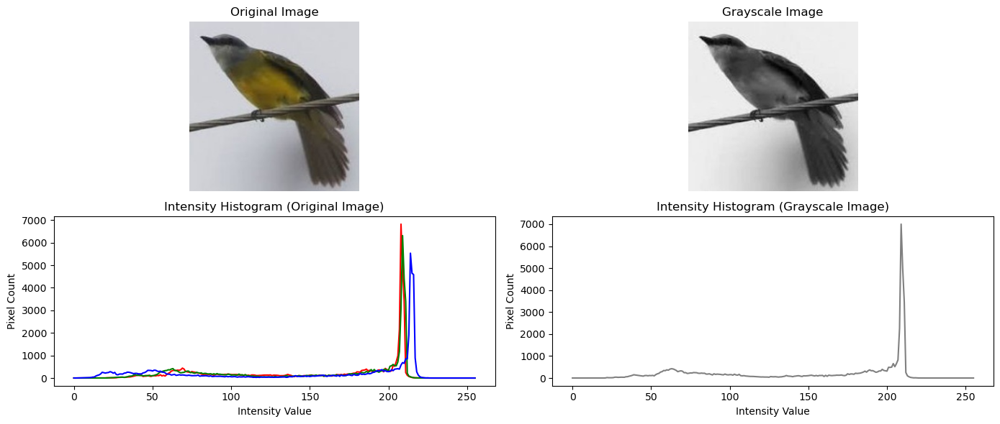

In [75]:
# Function to load an image
def load_image(img_path):
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB
    return img_rgb

# Function to convert an image to grayscale
def convert_to_grayscale(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # Convert from RGB to Grayscale
    return img_gray

# Function to calculate intensity histogram
def calculate_histogram(img, bins=256):
    if len(img.shape) == 3:  # If RGB image
        channels = cv2.split(img)
        colors = ('r', 'g', 'b')
        hist = {}
        for (chan, color) in zip(channels, colors):
            hist[color] = cv2.calcHist([chan], [0], None, [bins], [0, 256])
        return hist
    else:  # If grayscale image
        hist = cv2.calcHist([img], [0], None, [bins], [0, 256])
        return hist

# Directory containing images
data_dir = "train"

# Select a random image from the dataset
random_class = np.random.choice(os.listdir(data_dir))
class_dir = os.path.join(data_dir, random_class)
random_image = np.random.choice(os.listdir(class_dir))
image_path = os.path.join(class_dir, random_image)

# Load the image
original_img = load_image(image_path)

# Convert the image to grayscale
grayscale_img = convert_to_grayscale(original_img)

# Calculate histograms
original_hist = calculate_histogram(original_img)
grayscale_hist = calculate_histogram(grayscale_img)

# Plot the original and grayscale images side by side
plt.figure(figsize=(14, 6))

plt.subplot(2, 2, 1)
plt.imshow(original_img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(grayscale_img, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

# Plot the intensity histograms
plt.subplot(2, 2, 3)
for color in ('r', 'g', 'b'):
    plt.plot(original_hist[color], color=color)
plt.title('Intensity Histogram (Original Image)')
plt.xlabel('Intensity Value')
plt.ylabel('Pixel Count')

plt.subplot(2, 2, 4)
plt.plot(grayscale_hist, color='gray')
plt.title('Intensity Histogram (Grayscale Image)')
plt.xlabel('Intensity Value')
plt.ylabel('Pixel Count')

plt.tight_layout()
plt.show()

## GMMU  PLOT

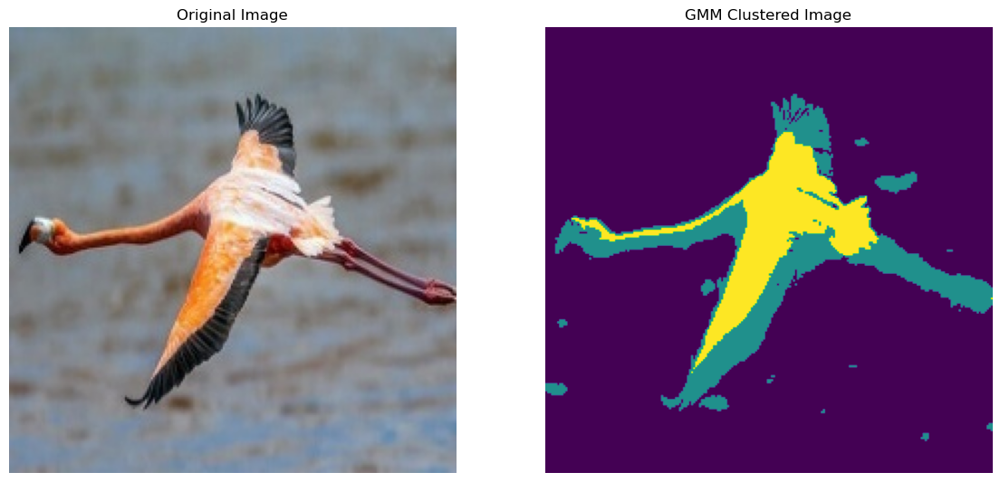

In [83]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture

# Function to apply GMM clustering
def apply_gmm_clustering(image, n_components=3):
    # Convert image to RGB if it is in BGR
    if len(image.shape) == 3 and image.shape[2] == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Reshape the image to a 2D array of pixels
    pixels = image.reshape(-1, 3)
    
    # Apply Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_components, random_state=42)
    gmm.fit(pixels)
    labels = gmm.predict(pixels)
    
    # Reshape the labels to the original image shape
    clustered_image = labels.reshape(image.shape[0], image.shape[1])
    
    return clustered_image, gmm.means_

# Directory containing images
data_dir = "train"

# Get a random class directory
random_class = random.choice(os.listdir(data_dir))
class_dir = os.path.join(data_dir, random_class)

# Get a random image path from the class directory
random_image_path = os.path.join(class_dir, random.choice(os.listdir(class_dir)))

# Read the image
original_image = cv2.imread(random_image_path)

# Apply GMM clustering
clustered_image, cluster_centers = apply_gmm_clustering(original_image, n_components=3)

# Plot the original and clustered images
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(clustered_image, cmap='viridis')
plt.title('GMM Clustered Image')
plt.axis('off')

plt.show()

## ANALYSING THE FEATURE SCALE USING BOXPLOT

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Function to extract saturation values from images
def extract_saturation(image):
    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    # Extract the saturation channel
    saturation = hsv[:,:,1]
    return saturation

# Directory containing images
data_dir = "train"

# Sample a few classes and images
classes = np.random.choice(os.listdir(data_dir), 50, replace=True)  # Random 50 species
num_images_per_class = 10  # Sample 10 images per species

# Create a list to store saturation values and labels
saturation_data = []

# Iterate over each class (species)
for bird_class in classes:
    class_dir = os.path.join(data_dir, bird_class)
    images = np.random.choice(os.listdir(class_dir), num_images_per_class, replace=False)  # Sample images
    for img_name in images:
        image_path = os.path.join(class_dir, img_name)
        image = cv2.imread(image_path)
        # Extract saturation values from the image
        saturation = extract_saturation(image)
        # Flatten saturation values and add to list with class label
        saturation_data.extend([(value, bird_class) for value in saturation.flatten()])

# Create a DataFrame from the saturation data
df = pd.DataFrame(saturation_data, columns=['Saturation', 'Species'])

# Split the DataFrame into 5 parts
unique_species = df['Species'].unique()
split_species = np.array_split(unique_species, 5)

# Define different colors for the plots
colors = ['skyblue', 'lightgreen', 'lightcoral', 'lightpink', 'lightsalmon']

# Plotting the sub boxplots
plt.figure(figsize=(20, 40))
for i, species_subset in enumerate(split_species):
    plt.subplot(5, 1, i + 1)
    subset_df = df[df['Species'].isin(species_subset)]
    sns.boxplot(x='Species', y='Saturation', data=subset_df, color=colors[i])
    plt.title(f'Sub Boxplot {i + 1}')
    plt.xticks(rotation=90)
    plt.grid(True)

plt.tight_layout()
plt.show()

## Application Of PCA For feature Reduction And Further Analysis:

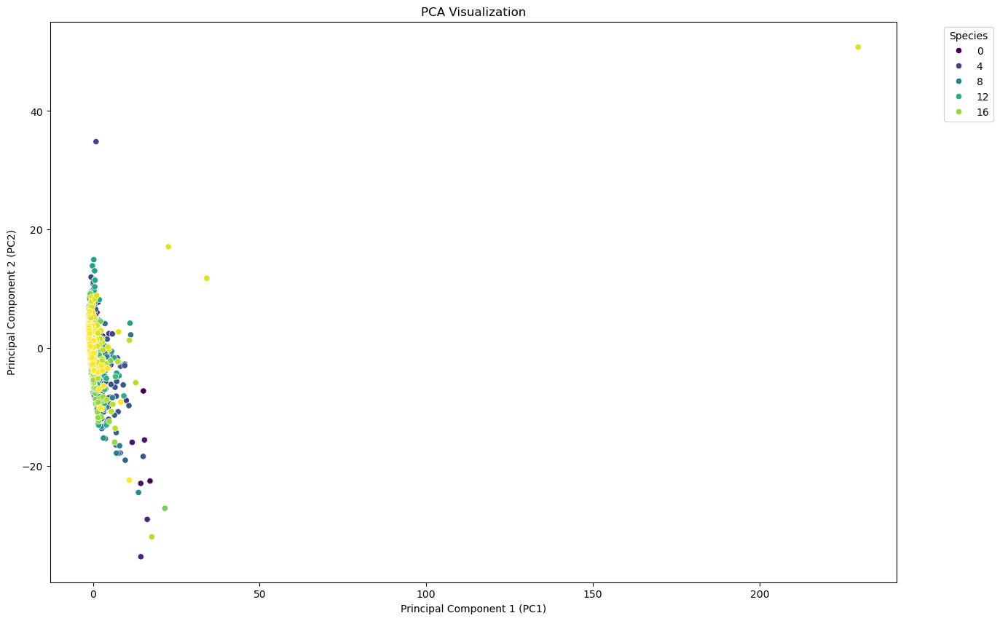

In [92]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

# Function to extract color histogram features
def extract_color_histogram(image, bins=(8, 8, 8)):
    # Convert the image to HSV color space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    # Compute the histogram and normalize it
    hist = cv2.calcHist([hsv], [0, 1, 2], None, bins, [0, 180, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

# Directory containing images
data_dir = "train"

# Collect features and labels
data = []
labels = []

# Iterate over each class (species)
classes = os.listdir(data_dir)
for bird_class in classes:
    class_dir = os.path.join(data_dir, bird_class)
    images = os.listdir(class_dir)  # All images in the class
    for img_name in images:
        image_path = os.path.join(class_dir, img_name)
        image = cv2.imread(image_path)
        if image is not None:
            hist = extract_color_histogram(image)
            data.append(hist)
            labels.append(bird_class)

# Create a DataFrame from the features
df = pd.DataFrame(data)
df['label'] = labels

# Encode labels to numbers
label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['label'])

# Separate features and labels
X = df.drop('label', axis=1)  # Features
y = df['label']  # Labels

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA(n_components=2)  # Choose the number of components as needed
X_pca = pca.fit_transform(X_scaled)

# Create a DataFrame for the PCA-transformed features
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df['label'] = y

# Plot the PCA-transformed features
plt.figure(figsize=(15, 10))
sns.scatterplot(x='PC1', y='PC2', hue='label', data=pca_df, palette='viridis')
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1 (PC1)')
plt.ylabel('Principal Component 2 (PC2)')
plt.legend(title='Species', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## VARIANCE RATIO

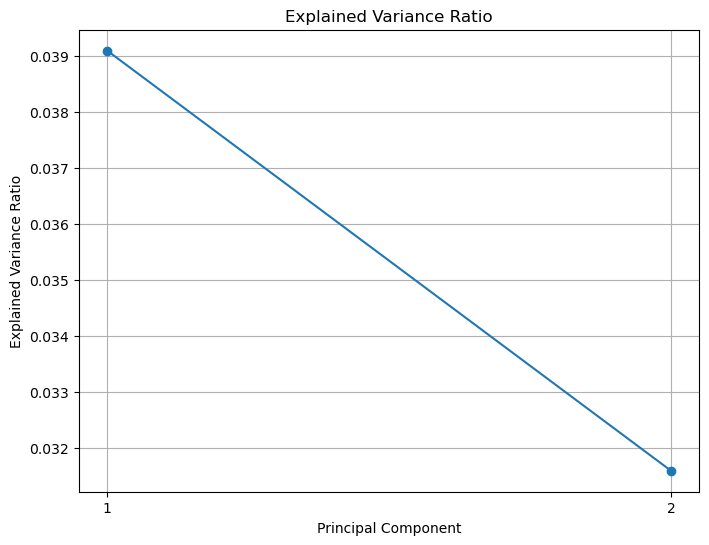

In [94]:
# Plot explained variance ratio
plt.figure(figsize=(8, 6))
plt.plot(range(1, pca.n_components_ + 1), pca.explained_variance_ratio_, marker='o', linestyle='-')
plt.title('Explained Variance Ratio')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.xticks(range(1, pca.n_components_ + 1))
plt.grid(True)
plt.show()